# <배틀그라운드 뉴비, 치킨은 못 먹어도 쉽게 Top10에 들어보자!>

# 1. 주제 선정

- 지금까지 넷상에 올라오는 배틀그라운드 전략은 대부분은 에임 실력이 좋은 플레이어를 대상으로 1등을 취하기 위한 전략이 많았음. 
- 배틀그라운드는 뉴비가 처음부터 쉽게 1등을 할 수 있는 게임이 아니기 때문에 뉴비를 위한 top10부터 안정적으로 들기 위한 최고의 생존전략이 궁금했다.
- 이번 EDA프로젝트를 통해 확인하고자 하는 것은 다음과 같다.
    - 1. 플레이어의 생존에 큰 영향을 미치는 핵심 Feature는 무엇인가. 
    - 2. 뉴비 플레이어가 안정적으로 top10에 들기 위해서는 어떻게 플레이해야할까?
        - 솔로, 듀오, 스쿼드 3가지 모드 중 어떤 모드에서 뉴비가 오랫동안 생존하기 좋은가.
        - 게임당 최소 적에게 주어야할 데미지, 최소 몇 킬을 기록해야 하는가.
        - 게임당 부스트아이템, 회복아이템은 얼마나 써야 하는가.
        - 플레이어의 생존 확률을 높이기 위한 효율적인 이동전략은 무엇인가.
        

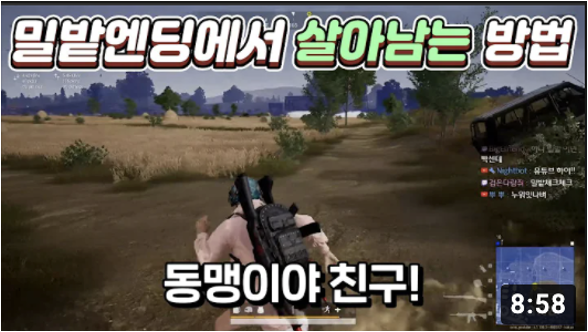, 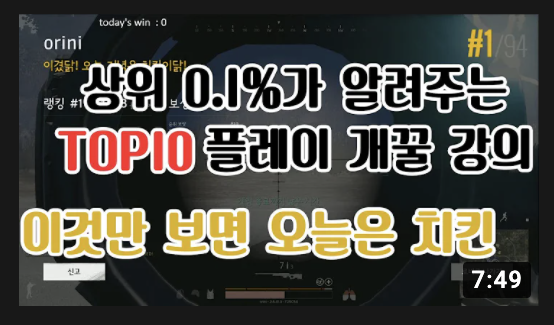

## 1-1. 데이터 출처

#### 데이터는 캐글 데이터를 사용했다.

https://www.kaggle.com/leonardokarl/pubg-statisctic

---

# 2. 데이터 탐색 및 전처리

### 필요한 모듈 불러오기

In [5]:
import pandas as pd
import missingno as msno
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings(action='ignore')
import re

print("pandas version: ", pd.__version__)
pd.set_option('display.max_columns', 150)

pandas version:  1.2.4


## 2-1 데이터 탐색

### 데이터 불러오기 및 합치기

In [6]:
solo = pd.read_csv("solo.csv",index_col=0)
duo = pd.read_csv("duo.csv",index_col=0)
squad = pd.read_csv("squad.csv",index_col=0)

In [7]:
solo['GameMode'] = 'solo'
duo['GameMode'] = 'duo'
squad['GameMode'] = 'squad'

total = pd.concat([solo,duo,squad]).reset_index(drop=True)
total

,player_name,KillDeathRatio,WinRatio,TimeSurvived,RoundsPlayed,Wins,WinTop10Ratio,Top10s,Top10Ratio,Losses,Rating,BestRating,DamagePg,HeadshotKillsPg,HealsPg,KillsPg,MoveDistancePg,RevivesPg,RoadKillsPg,TeamKillsPg,TimeSurvivedPg,Top10sPg,Kills,Assists,Suicides,TeamKills,HeadshotKills,HeadshotKillRatio,VehicleDestroys,RoadKills,DailyKills,WeeklyKills,RoundMostKills,MaxKillStreaks,Days,LongestTimeSurvived,MostSurvivalTime,AvgSurvivalTime,WinPoints,WalkDistance,RideDistance,MoveDistance,AvgWalkDistance,AvgRideDistance,LongestKill,Heals,Revives,Boosts,DamageDealt,DBNOs,GameMode
0,BreakNeck,3.14,17.65,18469.14,17,3,0.83,4,23.5,14,1559.78,1415.79,255.36,0.65,1.94,2.59,3321.28,0.00,0.00,0.00,1086.42,0.24,44,1,0,0,11,0.25,0,0,13,19,13,1,14,1909.66,1909.66,1262.83,2425,28924.31,27537.53,56461.84,2202.40,2764.50,304.87,33,0,29,4341.06,0,solo
1,Blackwalk,4.41,18.18,33014.86,33,6,0.36,11,33.3,27,1884.53,1860.74,393.04,1.27,1.82,3.61,5021.41,0.00,0.06,0.00,1000.45,0.33,119,2,0,0,42,0.35,3,2,18,18,13,3,10,1987.94,1987.94,1221.32,3812,47868.77,117837.74,165706.51,2017.38,5188.69,351.95,60,0,88,12970.39,0,solo
2,mercedes_benz,3.60,0.00,4330.44,5,0,0.00,1,20.0,5,1255.92,1266.60,329.76,0.60,1.00,3.60,2804.80,0.00,0.00,0.00,866.09,0.20,18,1,0,0,3,0.17,0,0,1,18,10,1,4,1578.31,1578.31,1133.17,2061,6340.79,7683.20,14023.99,1375.70,3052.50,125.76,5,0,3,1648.82,0,solo
3,DORA,14.00,50.00,13421.82,8,4,0.67,6,75.0,4,1798.70,1765.13,751.95,0.50,1.00,7.00,5986.82,0.00,0.00,0.00,1677.73,0.75,56,3,0,0,4,0.07,0,0,8,48,14,2,5,1980.79,1980.79,1677.73,1484,17579.69,30314.83,47894.53,2197.46,3789.35,412.25,8,0,24,6015.57,0,solo
4,n2tstar,10.50,33.33,9841.04,6,2,0.40,5,83.3,4,1668.67,1616.58,637.48,1.50,2.00,7.00,6526.96,0.00,0.00,0.00,1640.17,0.83,42,0,0,0,9,0.21,0,0,15,29,13,3,2,1923.71,1923.71,1640.17,1384,16736.41,22425.36,39161.77,2789.40,3737.56,307.97,12,0,21,3824.89,0,solo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263689,SaikoMene,0.94,3.57,61987.40,56,2,0.05,23,41.1,54,1625.68,1648.14,130.10,0.16,2.43,0.91,3775.38,0.27,0.00,0.11,1106.92,0.41,51,17,1,6,9,0.18,1,0,0,0,6,3,16,1975.01,1975.01,1074.56,2398,106099.84,105321.37,211421.17,1863.11,1503.24,489.84,136,15,70,7285.37,41,squad
263690,KARUKOR,1.42,8.70,90025.75,92,8,0.07,37,40.2,84,1912.70,1923.01,156.96,0.14,1.55,1.29,2632.12,0.28,0.00,0.09,978.54,0.40,119,33,3,8,13,0.11,1,0,2,3,9,3,22,2112.99,2112.99,1050.24,3606,144046.67,98108.14,242154.75,1636.41,1590.67,235.24,143,26,72,14440.64,97,squad
263691,Dertydann,0.90,1.46,126889.24,137,2,0.18,41,29.9,135,1727.56,1758.74,116.34,0.08,1.15,0.89,2804.78,0.18,0.01,0.02,926.20,0.30,122,38,0,3,11,0.09,2,1,8,11,5,4,31,2138.18,2138.18,1121.51,3747,207191.54,177062.72,384254.27,2109.40,1088.12,453.87,157,24,95,15939.11,92,squad
263692,Neferhor,2.88,15.95,220702.25,163,26,0.41,104,63.8,137,2311.01,2311.73,348.90,0.47,2.44,2.42,5234.55,0.24,0.02,0.04,1354.00,0.64,395,106,4,6,77,0.19,14,3,19,49,11,4,30,2187.04,2187.04,1312.41,4194,330179.44,523052.83,853232.16,1785.15,1804.51,449.91,397,39,317,56870.07,350,squad


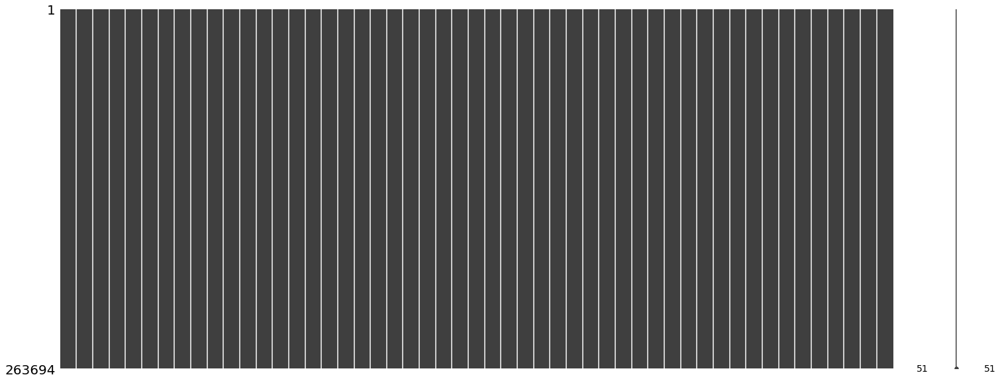

In [8]:
# 결측치 확인
msno.matrix(total)
plt.show()

## 2-2 데이터 전처리

#### 컬럼 튜닝

In [6]:
# 겹치거나 필요없는 column 삭제
total.drop(columns=['HeadshotKillRatio','Top10sPg','AvgSurvivalTime', 'AvgWalkDistance','AvgRideDistance'],inplace=True)


## 컬럼 만들기
# 플레이어의 게임당 평균 이동거리 컬럼 생성
total["WalkDistancePg"] =  total["WalkDistance"]/total["RoundsPlayed"]
total["RideDistancePg"] =  total["RideDistance"]/total["RoundsPlayed"]
# 우승확률 컬럼 생성
total["WinRatio"] =  total["Wins"]/total["RoundsPlayed"]
# 게임당 부스트아이템 사용갯수 컬럼 생성
total["BoostsPg"] = total["Boosts"] / total["RoundsPlayed"]
# 게임당 차량파괴 컬럼 생성
total["VehicleDestPg"] = total["VehicleDestroys"] / total["RoundsPlayed"]


,KillDeathRatio,WinRatio,WinTop10Ratio,Top10Ratio,DamagePg,HeadshotKillsPg,HealsPg,KillsPg,MoveDistancePg,RevivesPg,RoadKillsPg,TeamKillsPg,TimeSurvivedPg,WalkDistancePg,RideDistancePg,BoostsPg,VehicleDestPg,BestRating,Rating,DailyKills,WeeklyKills,RoundMostKills,MaxKillStreaks,LongestTimeSurvived,LongestKill,player_name,GameMode,K/D_category,Top10Ratio_range,WinRatio_GoodBad
0,3.14,0.176471,0.83,23.5,255.36,0.65,1.94,2.59,3321.28,0.00,0.00,0.00,1086.42,1701.430000,1619.854706,1.705882,0.000000,1415.79,1559.78,13,19,13,1,1909.66,304.87,BreakNeck,solo,초고수,30,bad
1,4.41,0.181818,0.36,33.3,393.04,1.27,1.82,3.61,5021.41,0.00,0.06,0.00,1000.45,1450.568788,3570.840606,2.666667,0.090909,1860.74,1884.53,18,18,13,3,1987.94,351.95,Blackwalk,solo,초고수,40,bad
2,3.60,0.000000,0.00,20.0,329.76,0.60,1.00,3.60,2804.80,0.00,0.00,0.00,866.09,1268.158000,1536.640000,0.600000,0.000000,1266.60,1255.92,1,18,10,1,1578.31,125.76,mercedes_benz,solo,초고수,20,bad
3,14.00,0.500000,0.67,75.0,751.95,0.50,1.00,7.00,5986.82,0.00,0.00,0.00,1677.73,2197.461250,3789.353750,3.000000,0.000000,1765.13,1798.70,8,48,14,2,1980.79,412.25,DORA,solo,초고수,80,good
4,10.50,0.333333,0.40,83.3,637.48,1.50,2.00,7.00,6526.96,0.00,0.00,0.00,1640.17,2789.401667,3737.560000,3.500000,0.000000,1616.58,1668.67,15,29,13,3,1923.71,307.97,n2tstar,solo,초고수,90,good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263689,0.94,0.035714,0.05,41.1,130.10,0.16,2.43,0.91,3775.38,0.27,0.00,0.11,1106.92,1894.640000,1880.738750,1.250000,0.017857,1648.14,1625.68,0,0,6,3,1975.01,489.84,SaikoMene,squad,초보,50,good
263690,1.42,0.086957,0.07,40.2,156.96,0.14,1.55,1.29,2632.12,0.28,0.00,0.09,978.54,1565.724674,1066.392826,0.782609,0.010870,1923.01,1912.70,2,3,9,3,2112.99,235.24,KARUKOR,squad,보통,50,good
263691,0.90,0.014599,0.18,29.9,116.34,0.08,1.15,0.89,2804.78,0.18,0.01,0.02,926.20,1512.347007,1292.428613,0.693431,0.014599,1758.74,1727.56,8,11,5,4,2138.18,453.87,Dertydann,squad,초보,30,bad
263692,2.88,0.159509,0.41,63.8,348.90,0.47,2.44,2.42,5234.55,0.24,0.02,0.04,1354.00,2025.640736,3208.913067,1.944785,0.085890,2311.73,2311.01,19,49,11,4,2187.04,449.91,Neferhor,squad,고수,70,good


#### EDA를 위한 데이터셋 만들기

In [ ]:
# 데이터셋에 같은 feature컬럼이 avg,ratio, count등 다양한 방식으로 중복되어 있음.
total

In [ ]:
# ratio를 기준으로 겹치지 않는 중요 컬럼들을 합쳐서 EDA를 위한 데이터셋을 만들어보자.
# pg(게임당), ratio컬럼 / avg(평균)컬럼 / 일반 컬럼 구분하기

#정규표현식
pg_regexp = re.compile(r"Pg")
ratio_regexp = re.compile(r"Ratio")
avg_regexp = re.compile(r"Avg")

ls = total.columns
PgRatio_col = []
avg_col = []
normal_col = []

# ratio컬럼 / avg(평균)컬럼 / 일반 컬럼 나눠담기
for data in ls: 
    if ratio_regexp.search(data):
        PgRatio_col.append(data)
    elif pg_regexp.search(data):
        PgRatio_col.append(data)
    elif avg_regexp.search(data):
        avg_col.append(data)
    else:
        normal_col.append(data)

        
# 필요 컬럼을 ratio컬럼 리스트에 넣어 데이터셋 만들기
# 플레이어 네임과 top10확률에 영향을 미칠 것으로 예상되는 컬럼들을 추가했다.
ls_test = ['player_name','BestRating','Rating','DailyKills','WeeklyKills','RoundMostKills','MaxKillStreaks',
     'LongestTimeSurvived','LongestKill','GameMode']
for i in ls_test:
    PgRatio_col.append(i)

total_ratio = total[PgRatio_col]
total_ratio

#### 그룹간 그래프 비교를 위해 데이터 범주화

In [ ]:
# 범주화 함수 만들기
# 연속형데이터의 범주형 컬럼만들기 함수
def create_range_data(df, col, bins_start, bins_end, bins_jump):
    df[f'{col}_range'] = pd.cut(df[f'{col}'],
                               bins=range(bins_start,bins_end+bins_jump,bins_jump),
                               include_lowest=True,
                               labels=range(bins_start+bins_jump,bins_end+bins_jump,bins_jump))
# 만들어진 컬럼 드랍 함수   
def drop_col(df, col):
    df.drop([f'{col}_range'], axis=1, inplace=True)

    
#kd에 따른 플레이어그룹 범주화
total_ratio.loc[total_ratio['KillDeathRatio']<=1, 'K/D_category'] = "초보"
total_ratio.loc[(total_ratio['KillDeathRatio']>1)&(total_ratio['KillDeathRatio']<=2), 'K/D_category'] = "보통"
total_ratio.loc[(total_ratio['KillDeathRatio']>2)&(total_ratio['KillDeathRatio']<=3), 'K/D_category'] = "고수"
total_ratio.loc[total_ratio['KillDeathRatio']>3, 'K/D_category'] = "초고수"

#top10확률에 따른 플레이어그룹 범주화
create_range_data(total_ratio,'Top10Ratio',0,100,10)
total_ratio['WinRatio_GoodBad'] = 0
total_ratio.loc[total_ratio['Top10Ratio_range']>=40, 'WinRatio_GoodBad'] = "good"
total_ratio.loc[total_ratio['Top10Ratio_range']<=40, 'WinRatio_GoodBad'] = "bad"
drop_col(total_ratio,'Top10Ratio')

In [ ]:
## top10에 들 확률이 100%인 플레이어들은 신뢰성이 낮은 데이터로 판단. 데이터셋에서 제거.

In [ ]:
# 이상치 제거
total_ratio = total_ratio[total_ratio['Top10Ratio']!=100]
total_ratio

---

# 3. EDA 

## 1. 플레이어의 생존에 큰 영향을 미치는 핵심 Feature는 무엇인가. 

#### heatmap으로 컬럼들의 상관계수를 살펴보자.

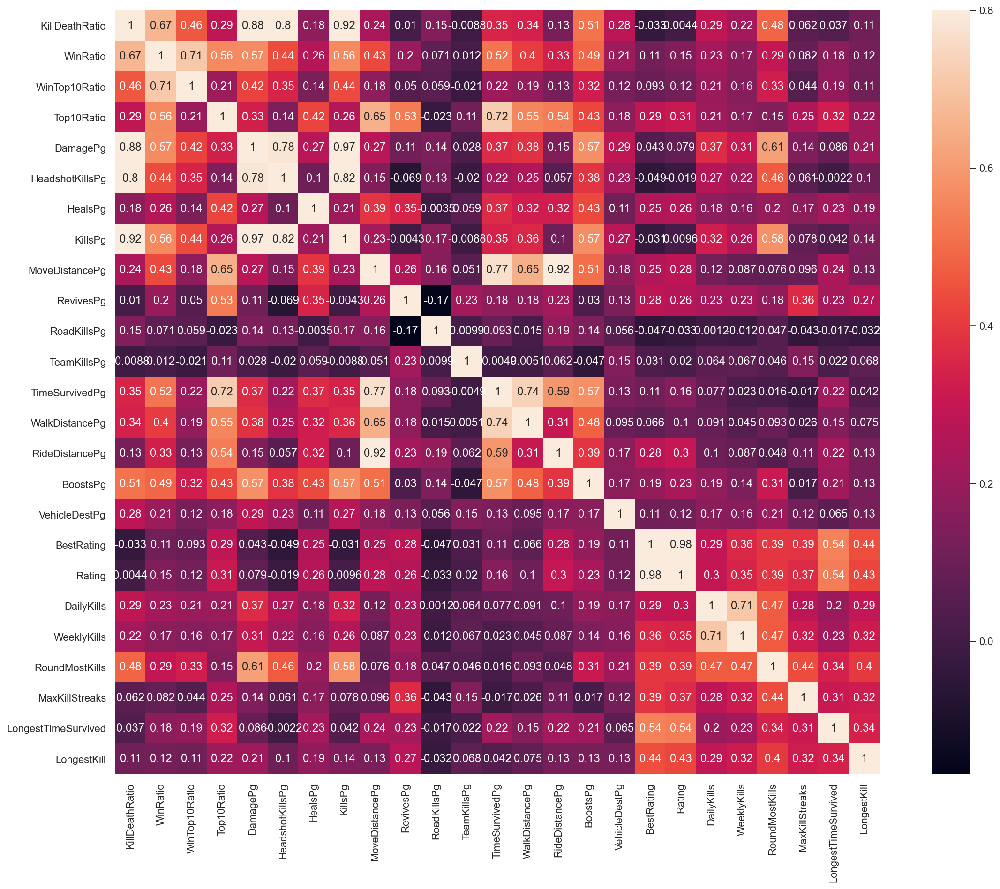

In [7]:
corrmat_total = total_ratio.corr()
f, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(corrmat_total, vmax=.8, square=True, annot=True, annot_kws={"size": 12});

#### top10 확률(targrt)과의 상관계수가 0.3 이상인 컬럼을 뽑아보자.

In [ ]:
mode_ls = ['total', 'solo', 'duo', 'squad' ]
useful_col = []
for value in mode_ls:
    globals()[f"corrmat_{value}"]
    globals()[f"useful_col_{value}"] = globals()[f"corrmat_{value}"][globals()[f"corrmat_{value}"]["Top10Ratio"].values >= 0.3].index.tolist()

useful_col = list(set(useful_col_total  + useful_col_duo + useful_col_solo + useful_col_squad))
useful_col

## 2. 뉴비 플레이어가 안정적으로 top10에 들기 위해서는 어떻게 플레이해야할까?

### 1) 솔로, 듀오, 스쿼드 3가지 모드 중 어떤 모드에서 뉴비가 생존에 유리한가.

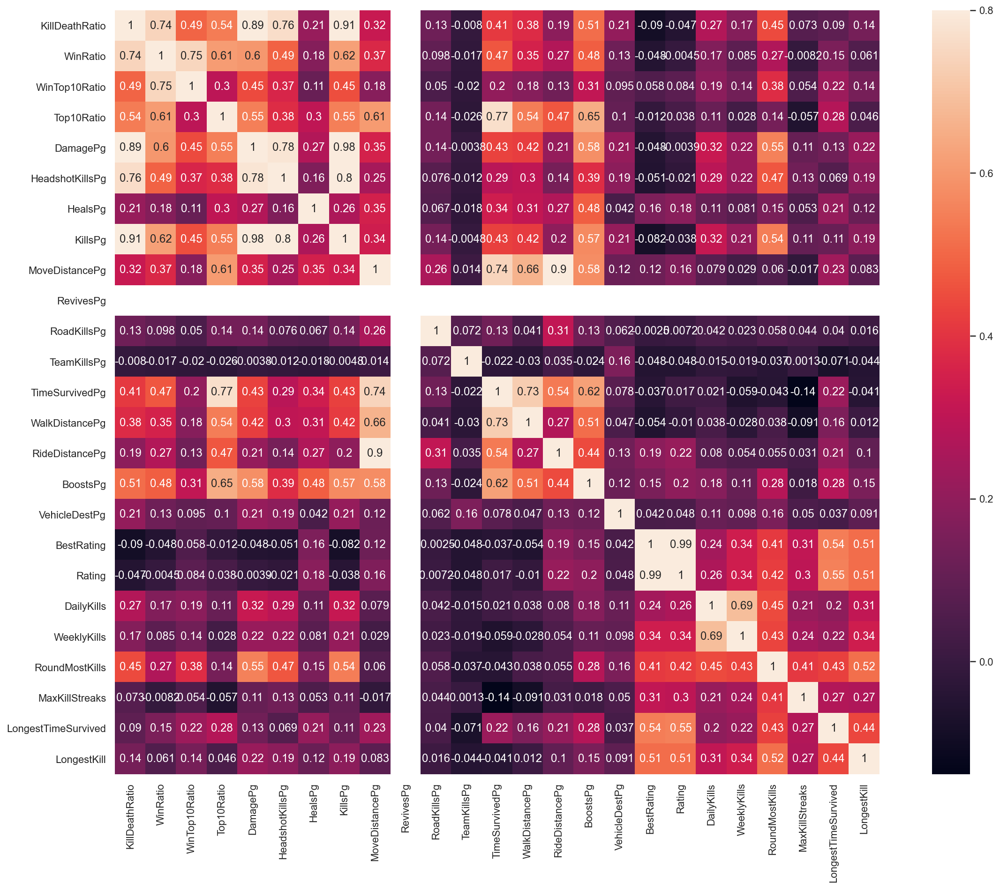

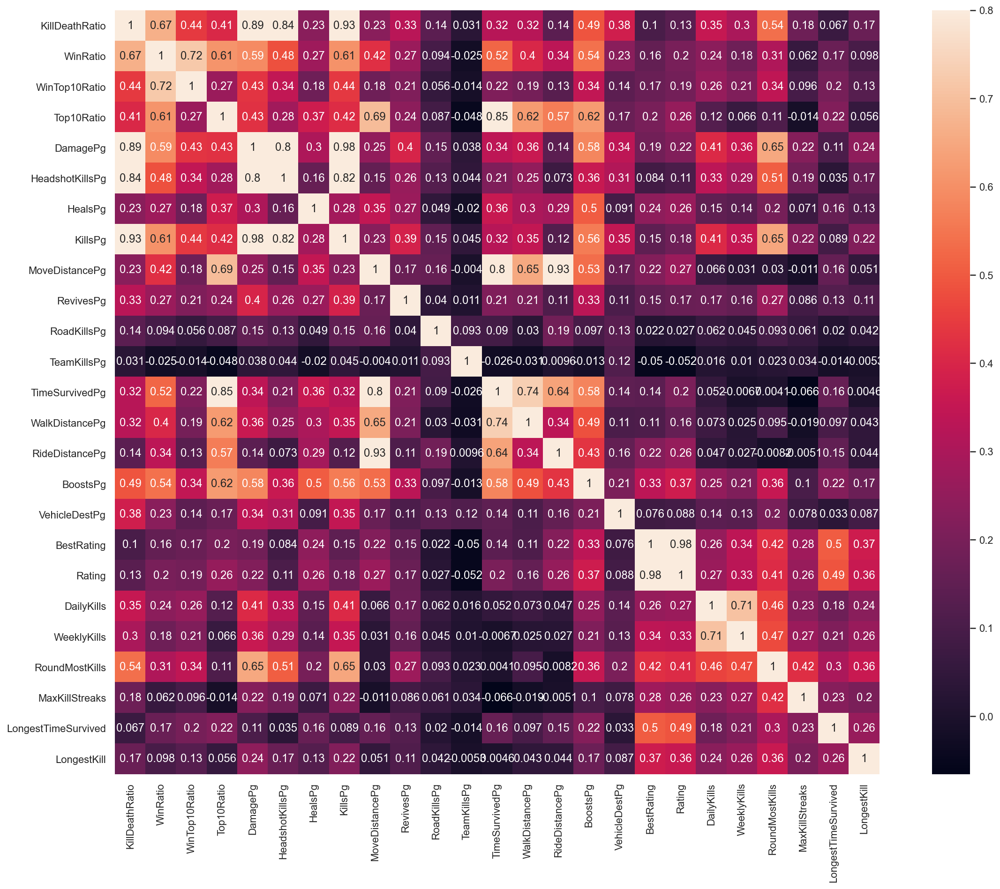

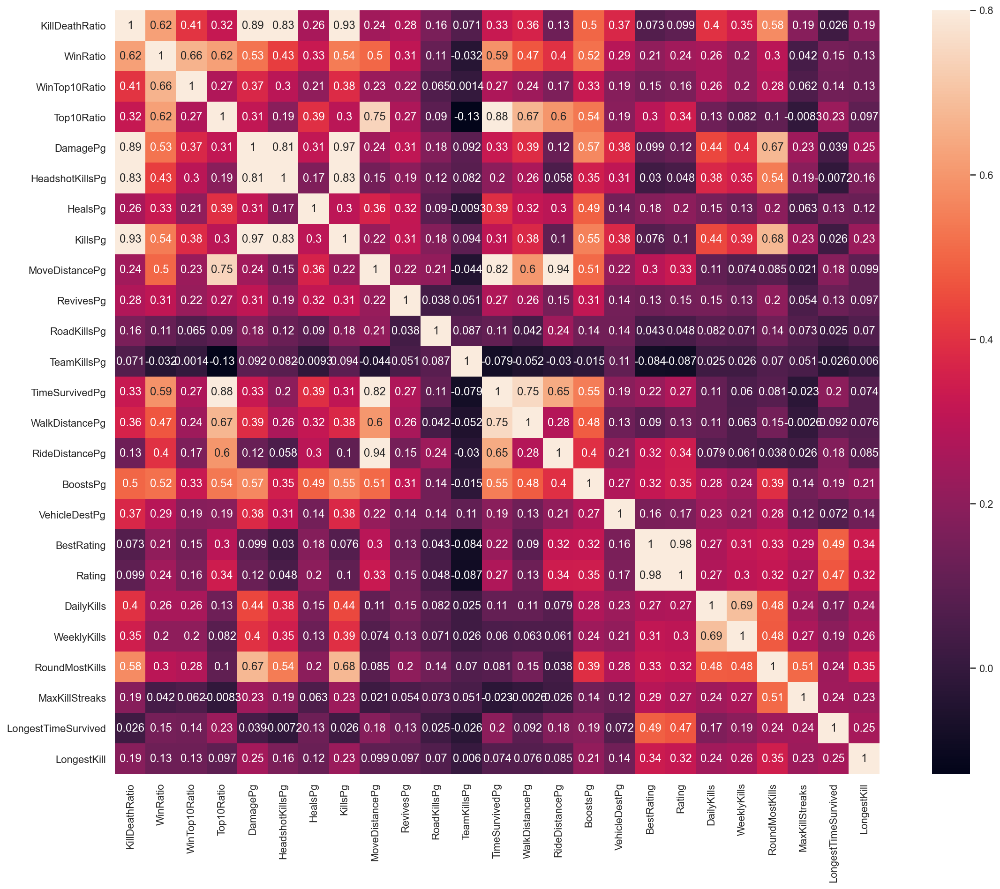

In [8]:
ls_heatmap = ['solo', 'duo', 'squad']
for value in ls_heatmap:
    globals()[f'corrmat_{value}'] = total_ratio[total_ratio['GameMode']==value].corr()
    f, ax = plt.subplots(figsize=(20, 15))
    sns.heatmap(globals()[f'corrmat_{value}'], vmax=.8, 
                square=True, annot=True, annot_kws={"size": 12});

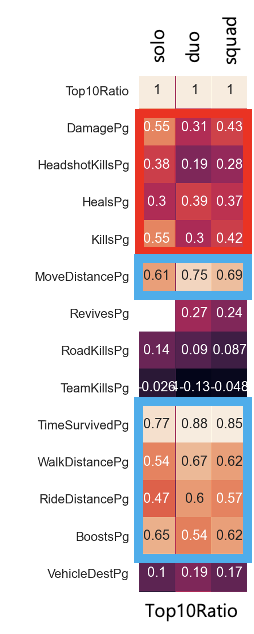
- (k/d, 데미지, 킬수 등) 총 쏘는 실력과 관련된 컬럼은 squad -> duo -> solo 일수록 더 높은 상관계수를 보인다.
- 그 외(아이템 사용 및 이동관련)의 컬럼은 solo -> duo -> squad 일수록 더 높은 상관관계를 보인다.
- 즉, 솔로모드에서는 top10에 들기위해 플레이어 개인의 에임실력이 중요하다.
- 팀원이 많을수록, 아이템의 사용방법과 이동방식과 같은 플레이어의 운영능력이 top10에 들 확률을 좌우한다.

## 2) 게임당 최소 적에게 주어야할 데미지, 최소 몇 킬을 기록해야 하는가.

#### 세부가설 1. Kill/Death를 높이면 TOP10에 들어갈 확률이 높아질것이다. 
#### KillDeathRatio = 총 죽인횟수/총 죽은횟수 (에임 실력과 관련있는 컬럼)

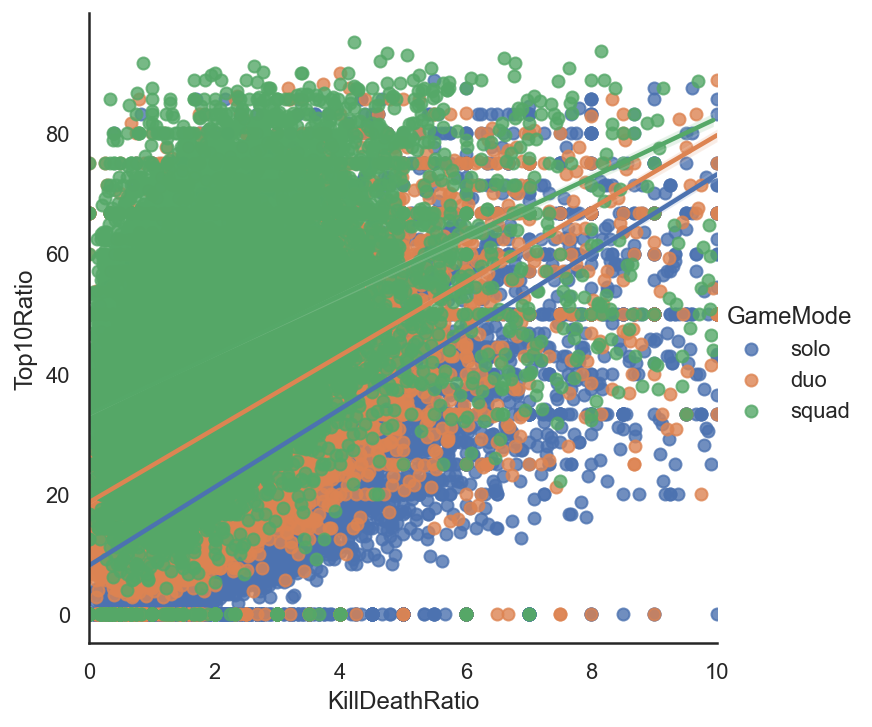

In [11]:
sns.lmplot(x="KillDeathRatio", y="Top10Ratio", hue="GameMode", 
           data=total_ratio[(total_ratio['KillDeathRatio']<=10)&(total_ratio['Top10Ratio']<=100)])

- 듀오, 스쿼드, 솔로 모두 탑10에 들어가는 비율과 양의 상관관계를 보인다.
- squad 선형 직선의 기울기가 가장 완만하다. => 게임모드를 sqaud로 할때, 에임 실력에 영향을 덜 받는다.

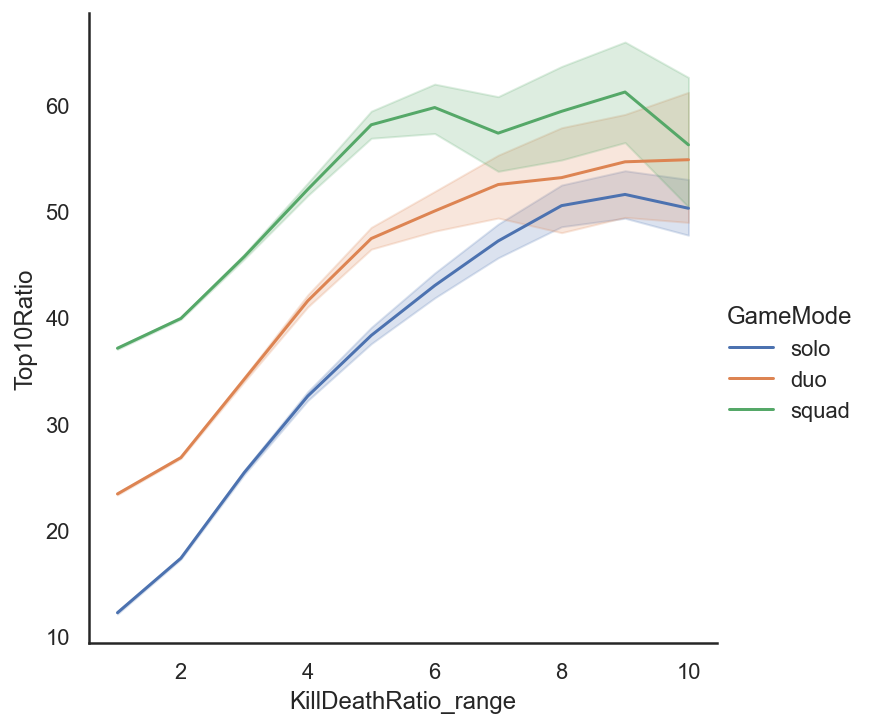

In [12]:
create_range_data(total_ratio, "KillDeathRatio", 0, 10, 1)
sns.relplot(x="KillDeathRatio_range", y="Top10Ratio", data=total_ratio, hue='GameMode', kind='line')
drop_col(total_ratio, "KillDeathRatio")

- 같은 K/D라도 게임모드를 squad로 할때 top10에 진입할 확률이 높다.

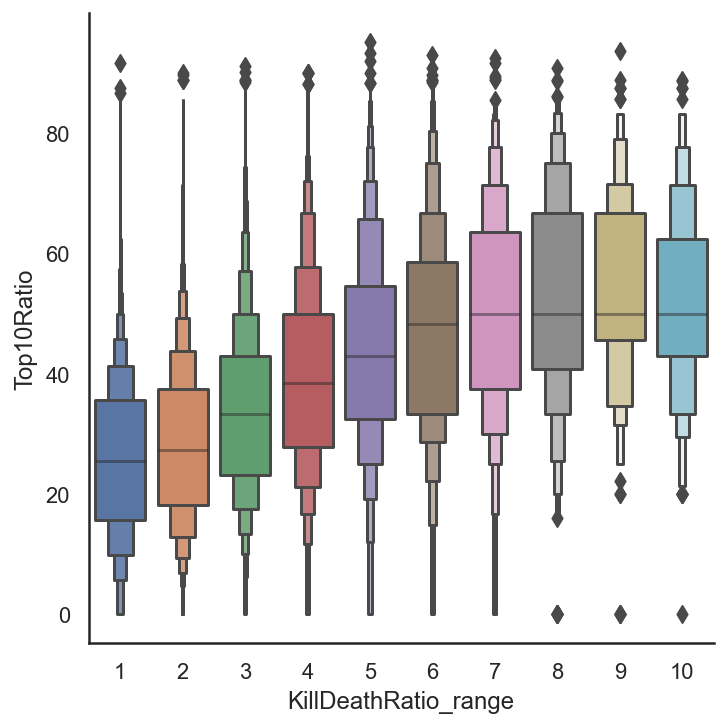

In [13]:
create_range_data(total_ratio, "KillDeathRatio", 0, 10, 1)


sns.catplot(x="KillDeathRatio_range", y="Top10Ratio", data=total_ratio, kind='boxen')
plt.show()

drop_col(total_ratio, "KillDeathRatio")

- 킬수가 많을수록 탑10에 들어갈 확률이 커진다.
- 하지만 kill수가 4명 이상이되면 탑10에 들어가는 확률에 미치는 영향이 줄어든다.
- 한판당 4~5명을 죽인다면 탑10에 들어갈 확률을 40이상 만들수 있다.

### 여기서 궁금한 내용.

- 과연 노력을 많이 하면 에임실력이 올라갈 수 있을까?

-0.17930205692175888


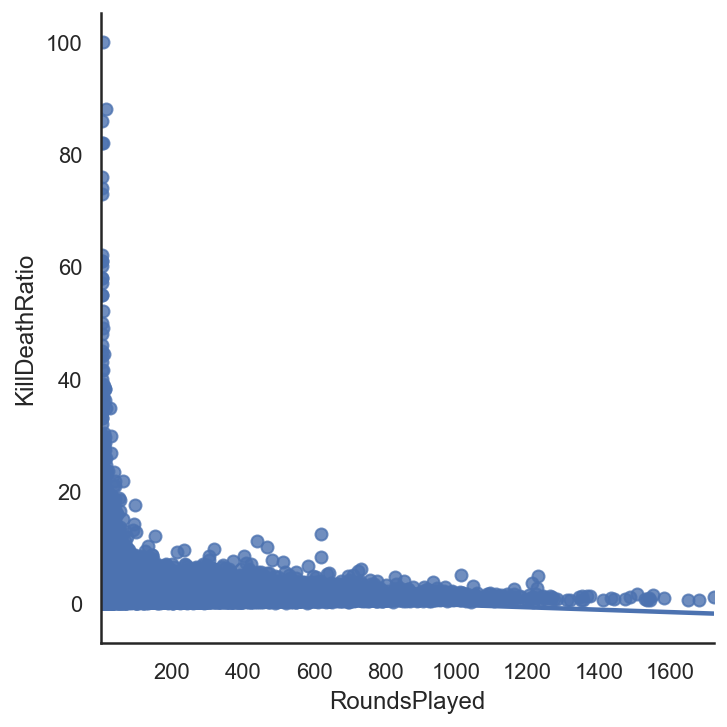

In [14]:
sns.lmplot(x="RoundsPlayed", y="KillDeathRatio", 
           data=total)
print(total['RoundsPlayed'].corr(total['KillDeathRatio']))

- 응 아니야~

squad 승률 25% 평균 : 1.1523862461220291
squad 승률 50% 평균 : 1.2889908026405688
squad 승률 75% 평균 : 2.0116002420679546
squad 승률 100% 평균 : 3.9380858085808588


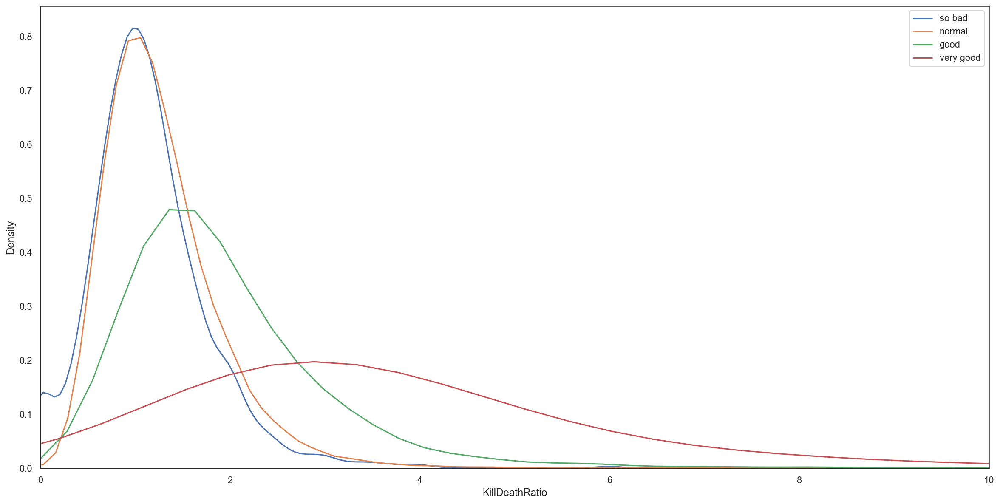

In [15]:
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['KillDeathRatio'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,10)
    print(f'squad 승률 {gb}% 평균 :',df['KillDeathRatio'].mean())
    
plt.show()

## 세부 가설 1의 결론
- 게임 모드는 스쿼드로 하며, 한판당 3.9킬정도 했을때 승률을 최고로 높일 수 있다.  
    - 하지만 K/D 3.9는 재능이 없는 우리에게 불가능에 가깝다.
    - KD 2.0을 목표로 삼아 에임실력을 조금이라도 끌어 올린다음, top10 진입 확률을 50~75%로 만들어보자!!

## 세부가설 2. 상대에게 Damage를 많이 입히면 TOP10에 들어갈 확률이 높아질것이다.

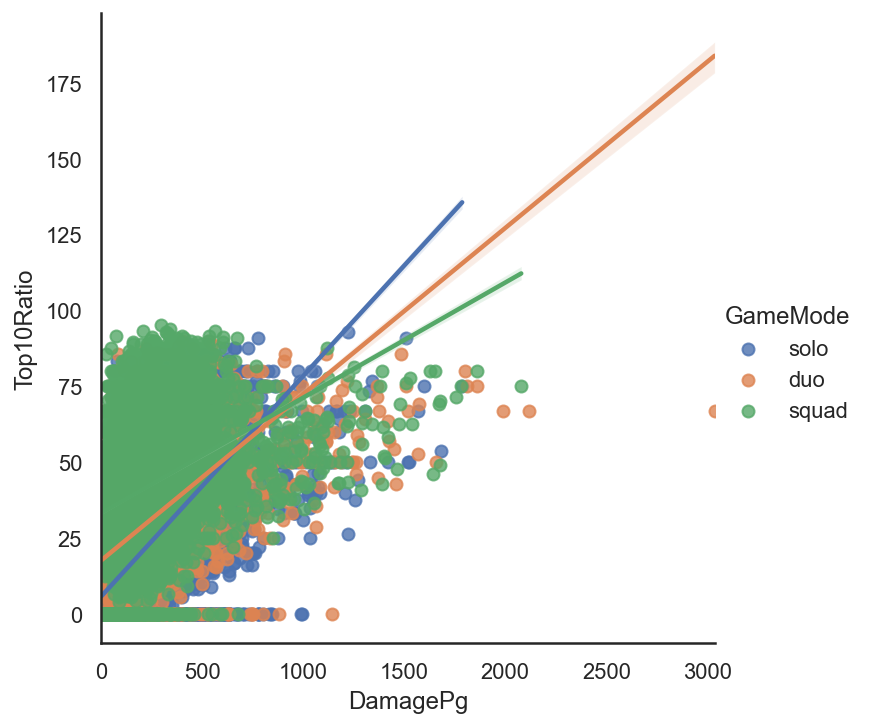

In [16]:
sns.lmplot(x="DamagePg", y="Top10Ratio", hue="GameMode", data=total_ratio)

- squad -> duo -> solo 순으로 DamagePg와 Top10Ratio가 강한 상관관계를 보인다.

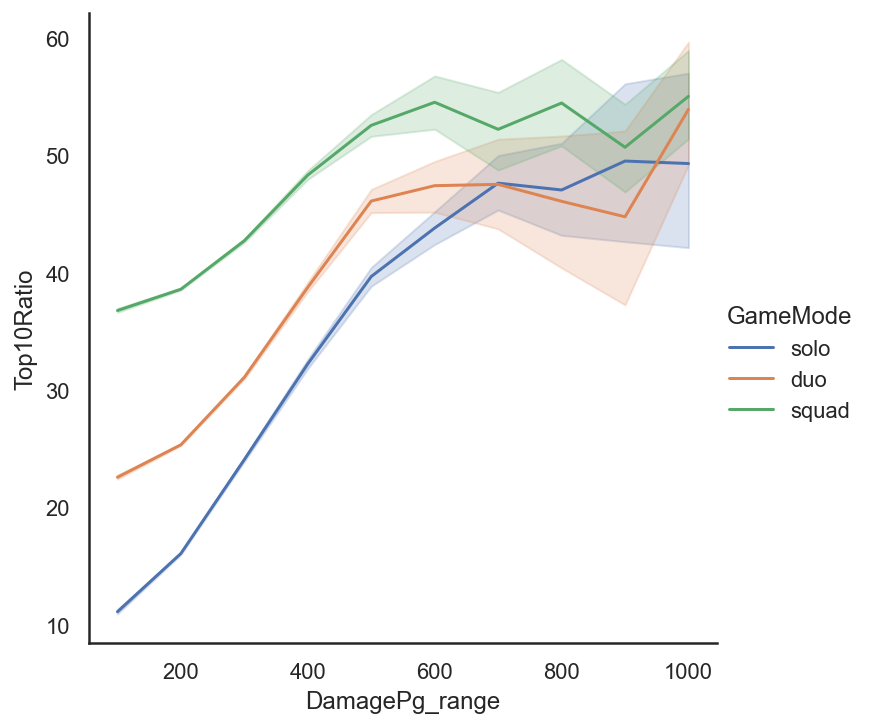

In [17]:
create_range_data(total_ratio, "DamagePg", 0, 1000, 100)
sns.relplot(x="DamagePg_range", y="Top10Ratio", data=total_ratio, hue='GameMode', kind='line')
drop_col(total_ratio, "DamagePg")

- 적에게 같은양의 Damage를 주었을 때 squad가 가장 높은 승률을 보여준다.
- 에임 실력이 떨어지는 우리에게는 squad가 딱이다.

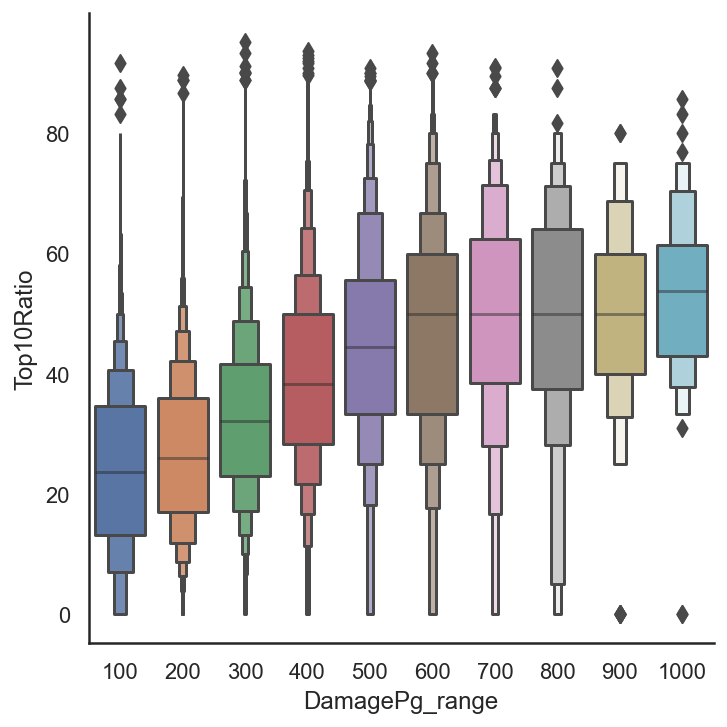

In [18]:
create_range_data(total_ratio, "DamagePg", 0, 1000, 100)


sns.catplot(x="DamagePg_range", y="Top10Ratio", data=total_ratio, kind='boxen')
plt.show()

drop_col(total_ratio, "DamagePg")

- 앞에 보았던 결과와 같이 두 컬럼간데 어느정도 상관이 있어보이지만, DamgePg 가 500이상부터는 증가율이 미비하다

squad 승률 25% 평균 : 155.5706876938987
squad 승률 50% 평균 : 169.94079580187469
squad 승률 75% 평균 : 231.45372352381798
squad 승률 100% 평균 : 323.8863036303631


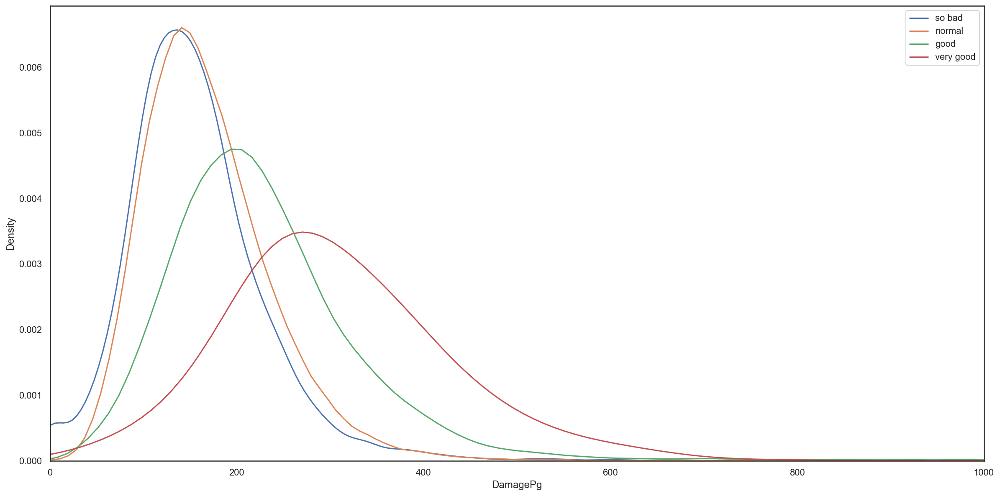

In [19]:
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['DamagePg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,1000)
    print(f'squad 승률 {gb}% 평균 :',df['DamagePg'].mean())
    
plt.show()

drop_col(total_ratio, "Top10Ratio")

## 세부가설 2 결론
- 한판당 평균 데미지의 양을 323정도 해주면, Top10 진입확률이 높겠지만, 우리의 에임실력으로는 안될것 같다. 목표를 조금 낮추자
- 게임모드는 squad 모드로 진행하며, 한판당 적에게 주는 데미지 목표를 231로 하여 승률을 50~75%로 만들어보자!!

## 세부가설 3. heal 아이탬 사용개수는 TOP10에 들어갈 확률에 영향을 미칠 것이다.

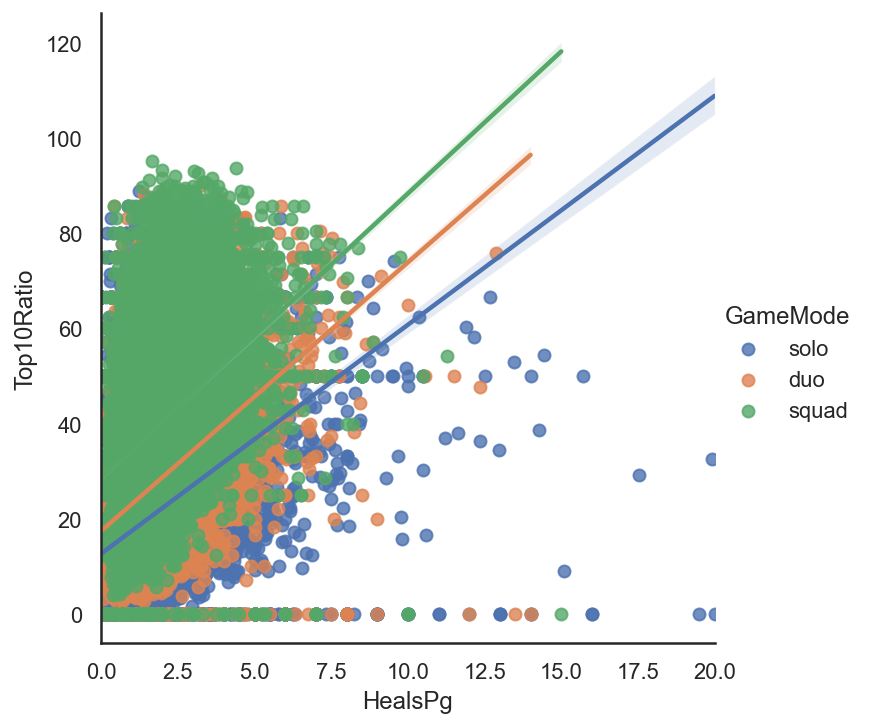

In [20]:
sns.lmplot(x="HealsPg", y="Top10Ratio", hue="GameMode", 
           data=total_ratio[(total_ratio['KillDeathRatio']<=10)&(total_ratio['Top10Ratio']<=100)])





- 미세하지만 solo, duo, squad 순으로 더 강한 양의 상관관계를 보여준다.

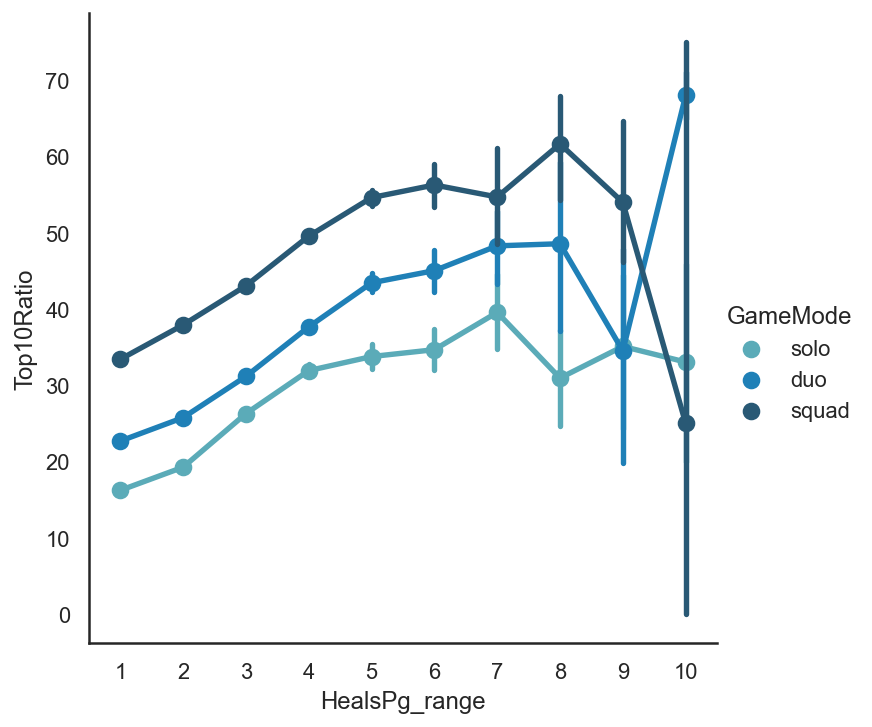

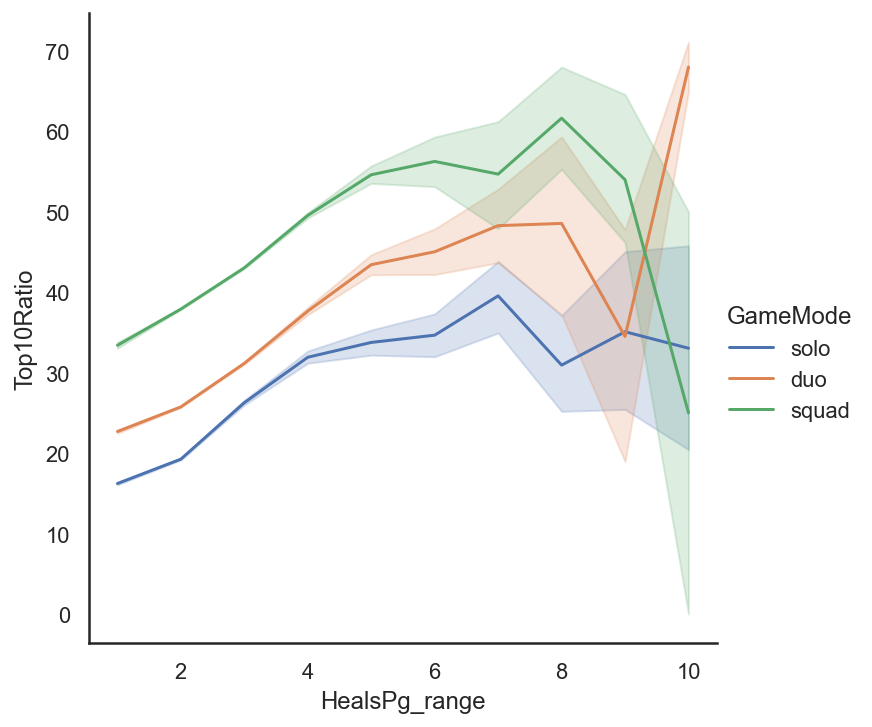

In [21]:
create_range_data(total_ratio, "HealsPg", 0, 10, 1)

sns.catplot(x="HealsPg_range", y="Top10Ratio", hue="GameMode", palette="YlGnBu_d", kind="point", data=total_ratio)
sns.relplot(x="HealsPg_range", y="Top10Ratio", data=total_ratio, hue='GameMode', kind='line')

drop_col(total_ratio, "HealsPg")

- 같은 Heal 아이템을 사용하더라도 squad 모드일 때 가장 높은 Top10 진입율을 보여준다.

squad 승률 25% 평균 : 1.413337642192344
squad 승률 50% 평균 : 1.8574551646173878
squad 승률 75% 평균 : 2.3908135212241715
squad 승률 100% 평균 : 2.8631848184818476


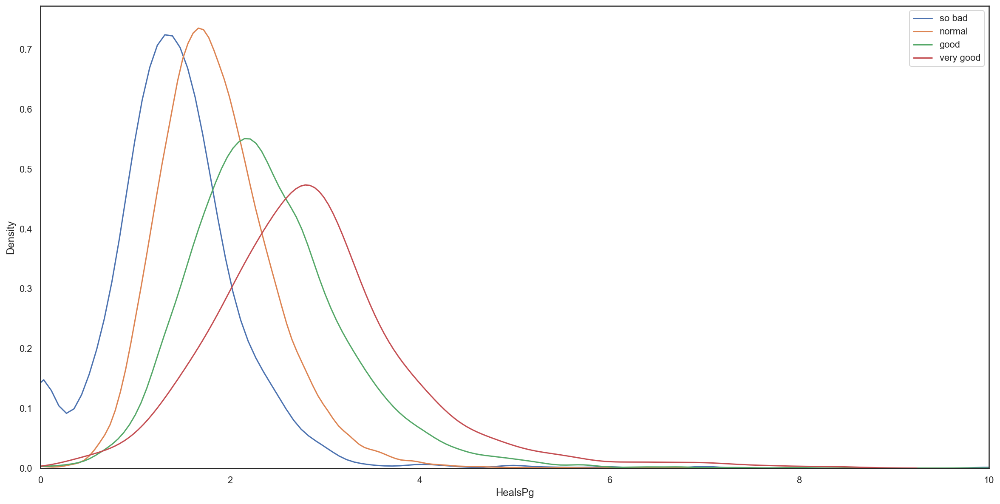

In [22]:
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['HealsPg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,10)
    print(f'squad 승률 {gb}% 평균 :',df['HealsPg'].mean())
    
plt.show()

drop_col(total_ratio, "Top10Ratio")

## 세부가설 3 결론
- 게임모드는 squad모드로 하며, 승률을 75~100으로 올리기위해 한판당 heal아이템을 2.8개 먹는다. 

## 세부가설 4: 부스트아이템의 사용갯수가 많아질수록 Top10에 들어갈 확률이 상승할 것이다.

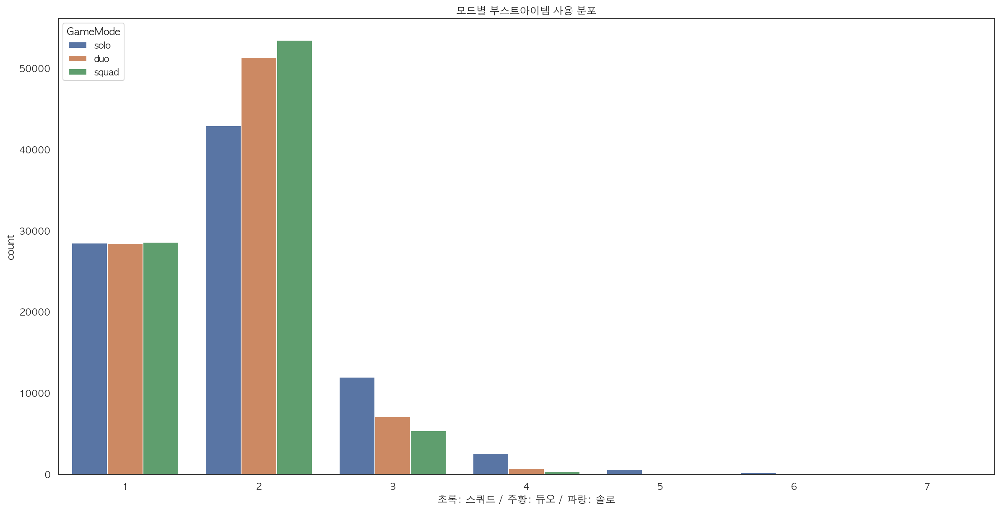

In [23]:
# 모드별 부스트아이템 사용갯수 분포
plt.rcParams['font.family'] = 'AppleGothic'
create_range_data(total_ratio,'BoostsPg',0,7,1)

plt.figure(figsize=(20,10))
sns.countplot('BoostsPg_range',data=total_ratio,hue='GameMode')
plt.title("모드별 부스트아이템 사용 분포")
plt.xlabel("초록: 스쿼드 / 주황: 듀오 / 파랑: 솔로")
plt.grid
plt.show()
drop_col(total_ratio, 'BoostsPg')

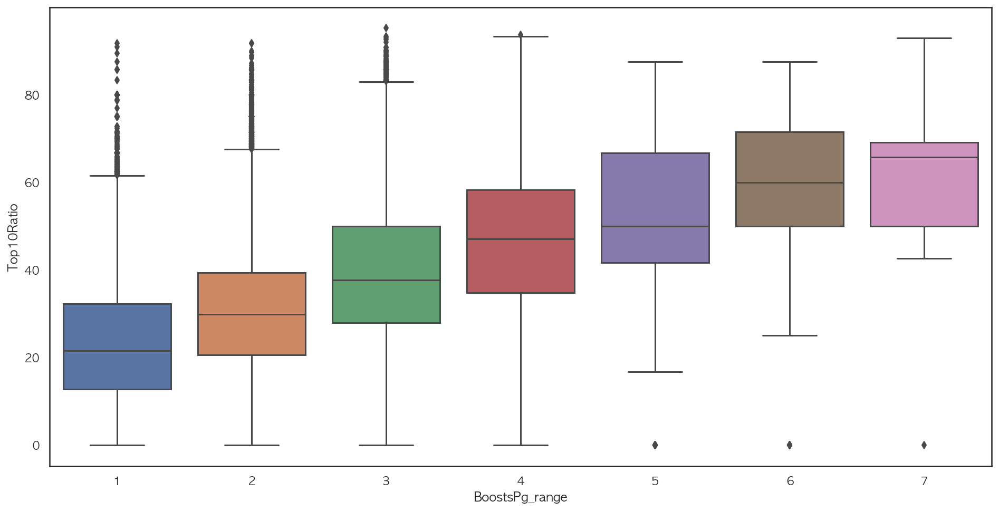

In [24]:
# 부스트 아이템 범주화 후 박스플롯

create_range_data(total_ratio,'BoostsPg',0,7,1)

plt.figure(figsize=(16,8))
sns.boxplot(x='BoostsPg_range',y='Top10Ratio', data=total_ratio)
plt.show()
drop_col(total_ratio, 'BoostsPg')

* 부스트아이템 사용갯수와 top10확률은 확실히 정비례한다.

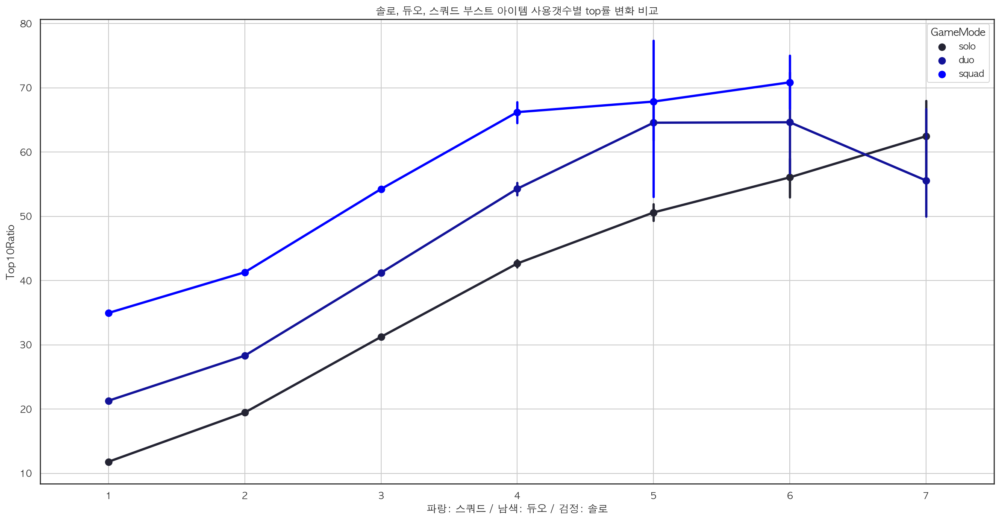

In [25]:
# 모드별 top10확률 비교
create_range_data(total_ratio,'BoostsPg',0,7,1)
plt.figure(figsize=(20,10))
sns.pointplot(x='BoostsPg_range',y='Top10Ratio',hue='GameMode', data=total_ratio,color='blue')
plt.title("솔로, 듀오, 스쿼드 부스트 아이템 사용갯수별 top률 변화 비교")
plt.xlabel("파랑: 스쿼드 / 남색: 듀오 / 검정: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio, 'BoostsPg')

* 같은갯수일때 스쿼드모드가 가장 좋은 승률을 보여준다.

squad 승률 25% 평균 : 0.8297112627100617
squad 승률 50% 평균 : 1.1863236429050545
squad 승률 75% 평균 : 1.6965125967520676
squad 승률 100% 평균 : 2.3510609685559154


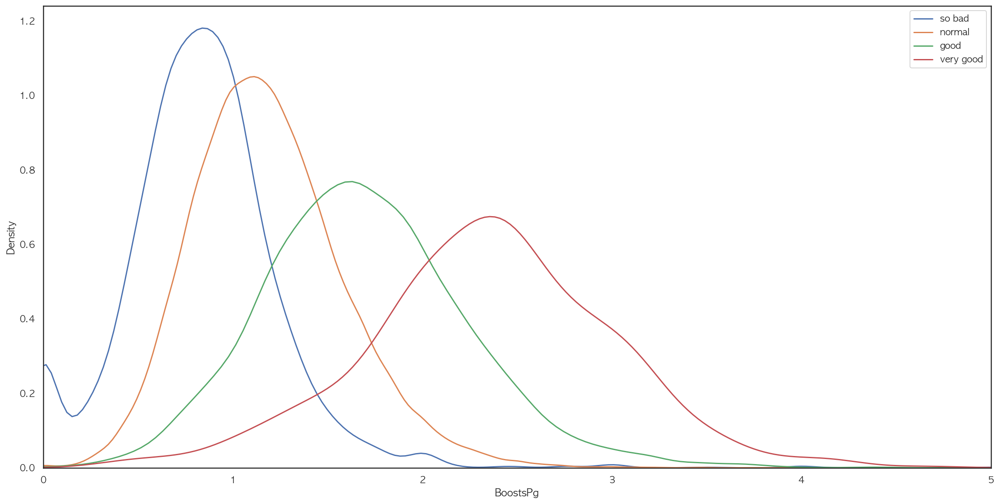

In [26]:
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['BoostsPg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,5)
    print(f'squad 승률 {gb}% 평균 :',df['BoostsPg'].mean())
    
plt.show()

drop_col(total_ratio,"Top10Ratio")

#### 가설4 결론
* top10확률로 나눈 플레이어 그룹 간 게임당 부스트아이템의 사용갯수에서 차이를 보인다는 것을 알 수 있다. top10에 들 확률이 높을수록 확실히 부스트아이템을 많이 사용한다.
* 승률 75~100%기준 부스트아이템은 약 2개 이상 사용하는 것이 이상적

## 세부가설 5: 팀원을 부활시킨 횟수가 많을수록 Top10에 들어갈 확률이 상승할 것이다.

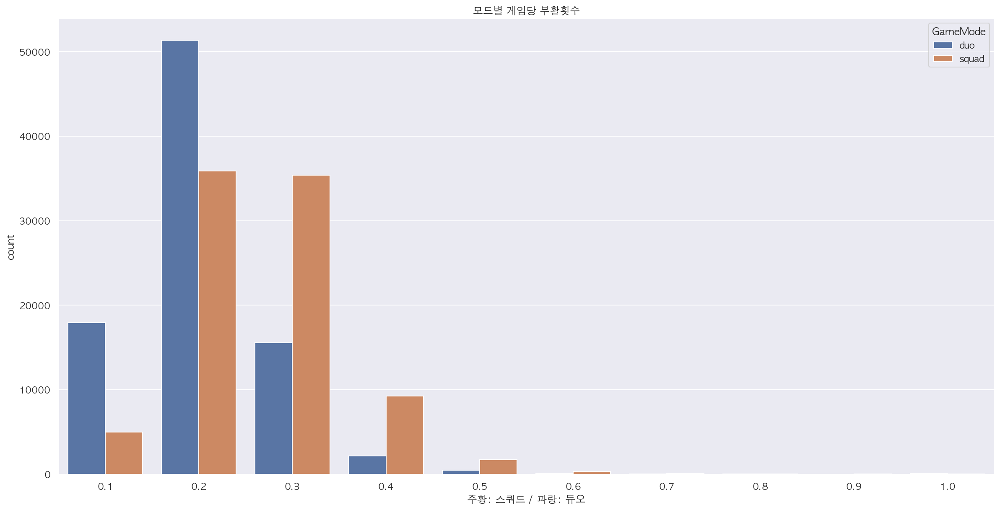

In [46]:
# 모드별 게임당 평균 부활횟수 분포
plt.rcParams['font.family'] = 'AppleGothic'
df = total_ratio[total_ratio['GameMode']!='solo']
rev = df.copy()
rev['RevivesRange'] = pd.cut(rev["RevivesPg"],
                                       bins=[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                           include_lowest=True,
                           labels=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
                             
plt.figure(figsize=(20,10))
sns.countplot('RevivesRange',data=rev,hue='GameMode')
plt.title("모드별 게임당 부활횟수")
plt.xlabel("주황: 스쿼드 / 파랑: 듀오")
plt.grid
plt.show()

* 솔로모드는 부활이 없으므로 제외.
* 플레이어가 게임당 팀원을 부활시킨 횟수는 평균 1회가 되지 않았다. 대부분 0.6회 이내

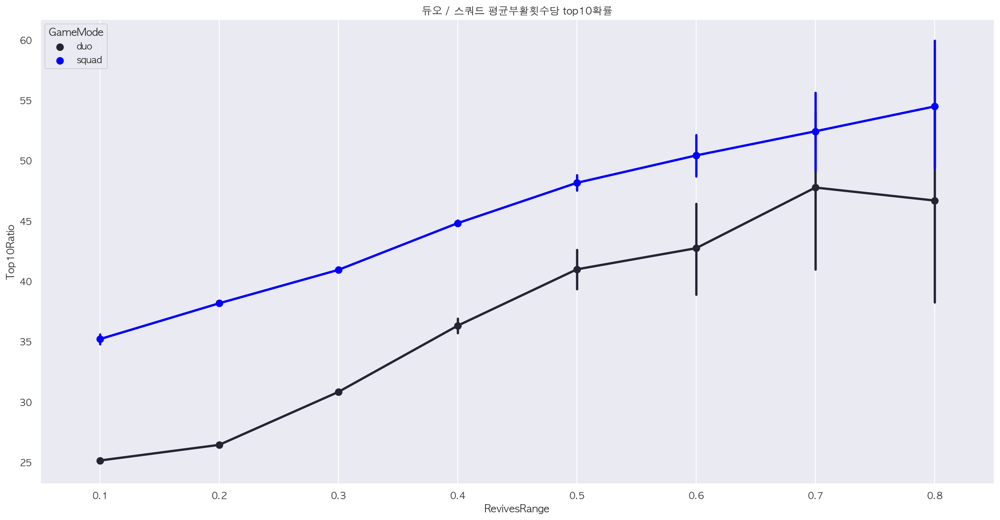

In [47]:
# 듀오와 스쿼드 부활횟수와 top10ratio 꺾은 선 그래프
rev['RevivesRange'] = pd.cut(rev["RevivesPg"],
                                       bins=[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8],
                           include_lowest=True,
                           labels=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8])

plt.figure(figsize=(20,10))
sns.pointplot(x='RevivesRange',y='Top10Ratio',hue='GameMode', data=rev,color='blue')
plt.title("듀오 / 스쿼드 평균부활횟수당 top10확률")
plt.grid()
plt.show()

* 전반적으로 부활횟수가 증가할수록 top10에 들 확률도 상승한다는 사실을 알 수 있다.

squad 승률 25% 평균 : 0.1693097207859362
squad 승률 50% 평균 : 0.21469511939817879
squad 승률 75% 평균 : 0.25615976484827496
squad 승률 100% 평균 : 0.32367986798679865


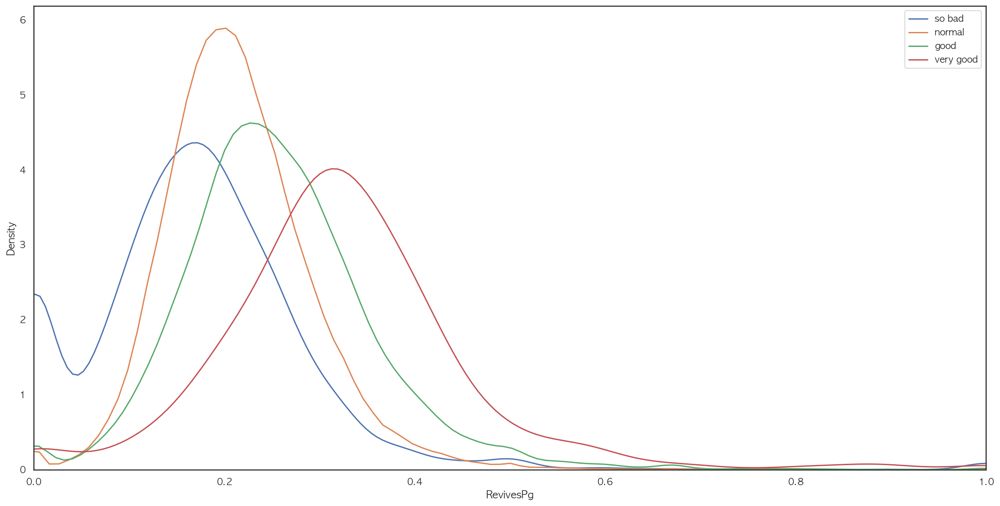

In [29]:
# top10확률로 나눈 네 그룹의 부활횟수 비교
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['RevivesPg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,1)
    print(f'squad 승률 {gb}% 평균 :',df['RevivesPg'].mean())
    
plt.show()

drop_col(total_ratio,"Top10Ratio")

*  top10확률이 높은 그룹일수록 부활횟수도 많다는 사실을 알 수 있다.

#### 가설5 결론
* 부활횟수가 많을수록 top10에 들 확률은 증가한다.
* 승률 75~100% 기준 플레이어는 게임당 0.3회정도 팀원을 부활시킨다.

## 세부가설 6:  이동거리가 증가할수록 Top10에 들어갈 확률이 상승할 것이다.

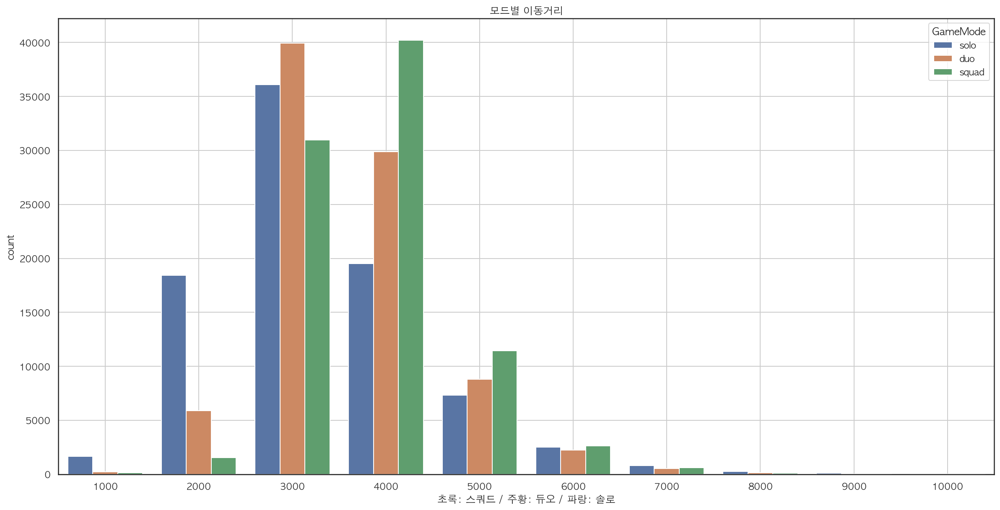

In [30]:
# 모드별 이동거리 CountPlot


create_range_data(total_ratio,"MoveDistancePg",0,10000,1000)
plt.figure(figsize=(20,10))
sns.countplot('MoveDistancePg_range',data=total_ratio,hue='GameMode')
plt.title("모드별 이동거리")
plt.xlabel("초록: 스쿼드 / 주황: 듀오 / 파랑: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'MoveDistancePg')

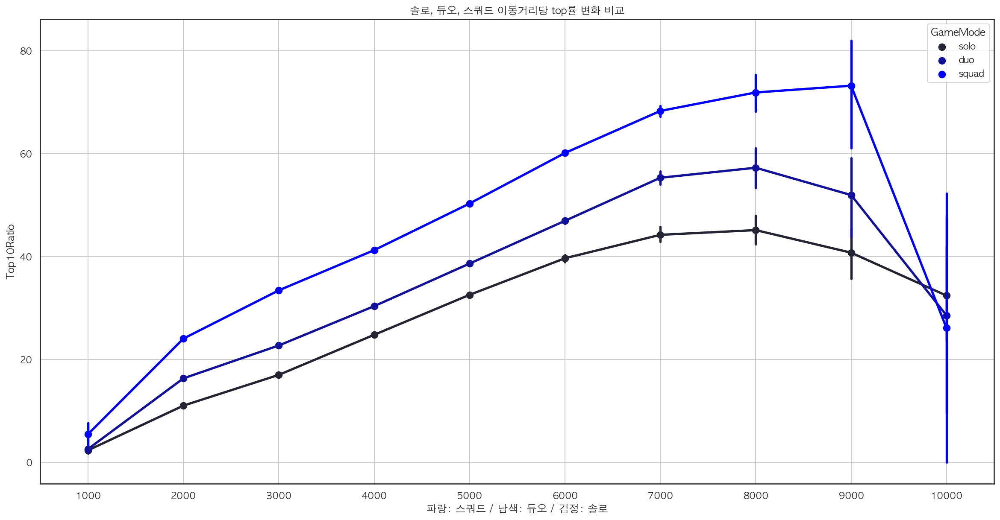

In [31]:
create_range_data(total_ratio,"MoveDistancePg",0,10000,1000)


plt.figure(figsize=(20,10))
sns.pointplot(x='MoveDistancePg_range',y='Top10Ratio',hue='GameMode', data=total_ratio,color='blue')
plt.title("솔로, 듀오, 스쿼드 이동거리당 top률 변화 비교")
plt.xlabel("파랑: 스쿼드 / 남색: 듀오 / 검정: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'MoveDistancePg')

* 전반적으로 8000m까지 꾸준히 top10확률이 증가한다.
* 팀원이 많은 모드일수록 이동거리에 따라 top10확률이 크게 증가한다.

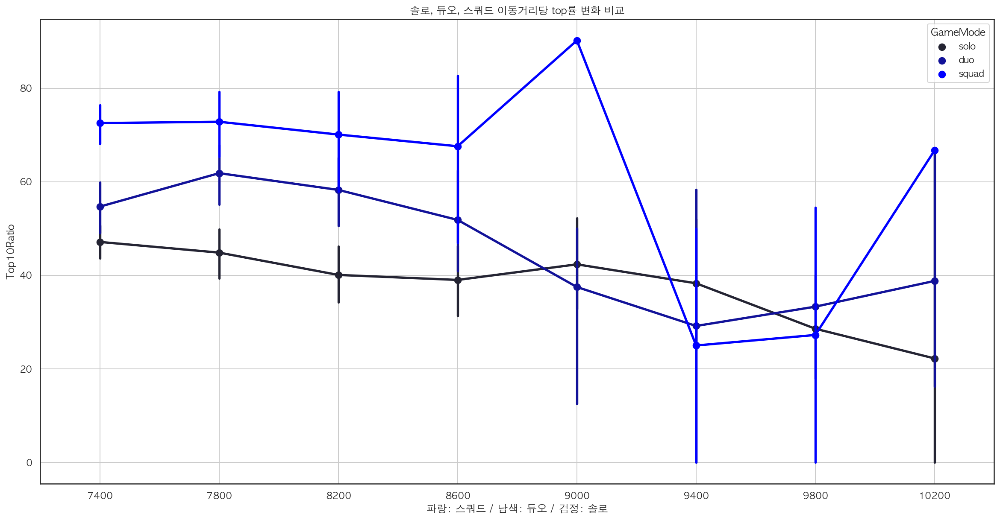

In [32]:
# 변곡점인 8000부터 10000까지 다시 그려보았다.

create_range_data(total_ratio,"MoveDistancePg",7000,10000,400)
    

plt.figure(figsize=(20,10))
sns.pointplot(x='MoveDistancePg_range',y='Top10Ratio',hue='GameMode', data=total_ratio,color='blue')
plt.title("솔로, 듀오, 스쿼드 이동거리당 top률 변화 비교")
plt.xlabel("파랑: 스쿼드 / 남색: 듀오 / 검정: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'MoveDistancePg')

* 변곡점을 시작점으로 좀 더 자세하게 그려보았지만, pointplot으로는 상관관계파악이 힘들다.

squad 승률 25% 평균 : 2313.253508273006
squad 승률 50% 평균 : 3189.4619967621047
squad 승률 75% 평균 : 4360.586572144903
squad 승률 100% 평균 : 5860.031881188119


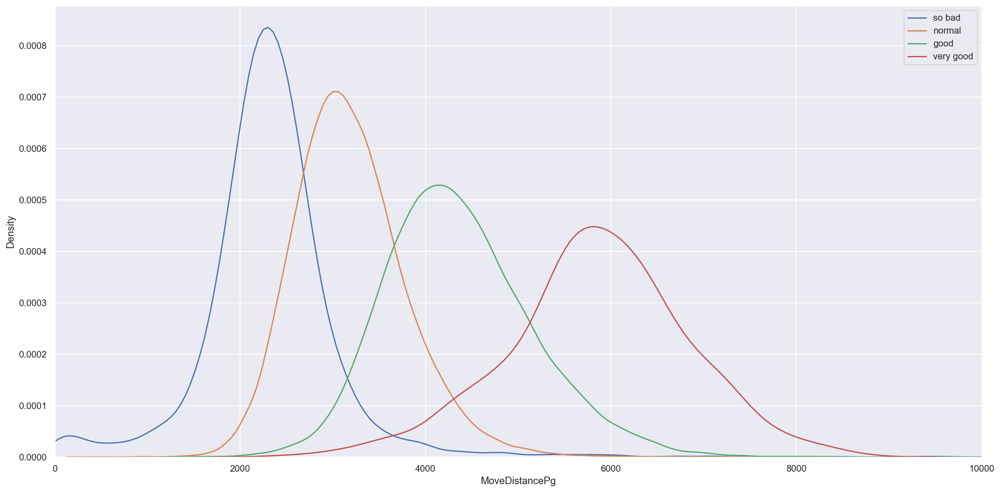

In [34]:
# top10 확률 별 이동거리 분포 

create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['MoveDistancePg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,10000)
    print(f'squad 승률 {gb}% 평균 :',df['MoveDistancePg'].mean())
    
plt.show()

drop_col(total_ratio,"Top10Ratio")

* top10에 들 확률이 높은 그룹일 수록 이동거리가 많다는 것을 알 수 있다. 

#### 가설6 결론
* 이동거리가 많을수록 top10에 들 가능성이 높아진다.
* top10에 들 확률을 75%이상으로 높이기 위해서는 약 6000m 이동하는 것이 이상적

## 세부가설 7: 걸어서 이동한 거리가 증가할수록 Top10에 들어갈 확률이 상승할 것이다.

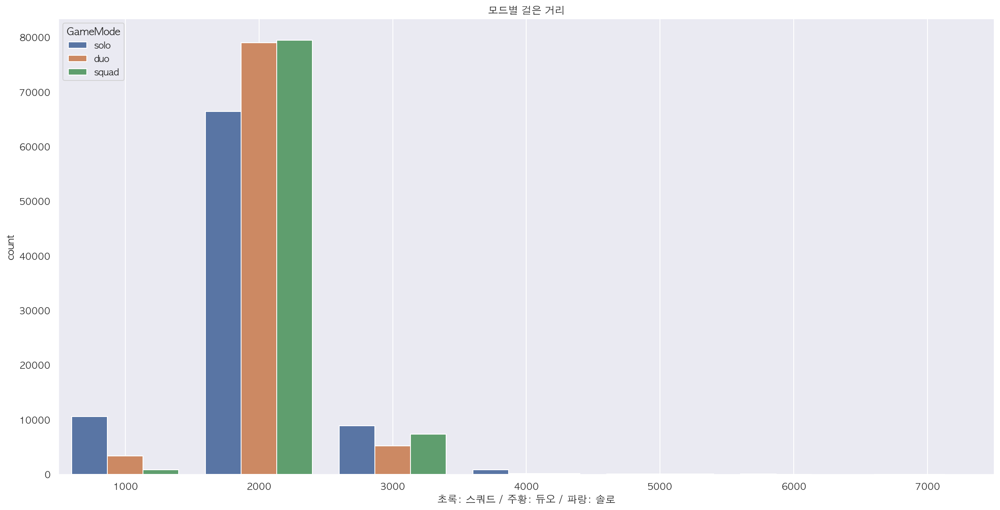

In [35]:
# 모드별 걸은 거리 CountPlot

plt.rcParams['font.family'] = 'AppleGothic'
create_range_data(total_ratio,"WalkDistancePg",0,7000,1000)

plt.figure(figsize=(20,10))
sns.countplot('WalkDistancePg_range',data=total_ratio,hue='GameMode')
plt.title("모드별 걸은 거리")
plt.xlabel("초록: 스쿼드 / 주황: 듀오 / 파랑: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'WalkDistancePg')

* 플레이어들이 걸어서 이동한 거리는 대체로 4000m이내

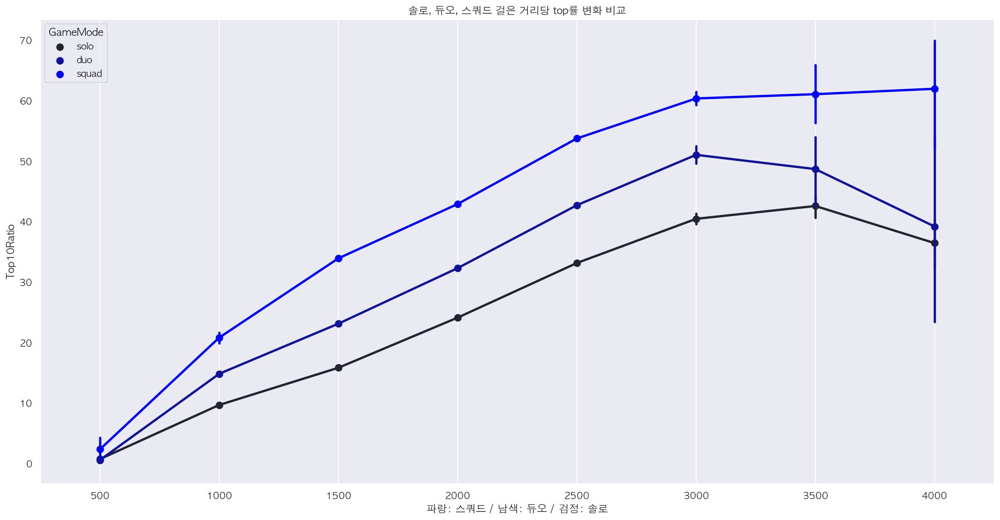

In [36]:

create_range_data(total_ratio,"WalkDistancePg",0,4000,500)
    
plt.figure(figsize=(20,10))
sns.pointplot(x='WalkDistancePg_range',y='Top10Ratio',hue='GameMode', data=total_ratio,color='blue')
plt.title("솔로, 듀오, 스쿼드 걸은 거리당 top률 변화 비교")
plt.xlabel("파랑: 스쿼드 / 남색: 듀오 / 검정: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'WalkDistancePg')

* 걸어서 이동한 거리가 증가할수록 top10에 들어갈 확률도 증가한다.
* 팀원이 많은 모드일수록 상승폭이 가파르다.

squad 승률 25% 평균 : 1211.5108272627604
squad 승률 50% 평균 : 1550.2585986080123
squad 승률 75% 평균 : 1929.7587764977209
squad 승률 100% 평균 : 2212.2188810756606


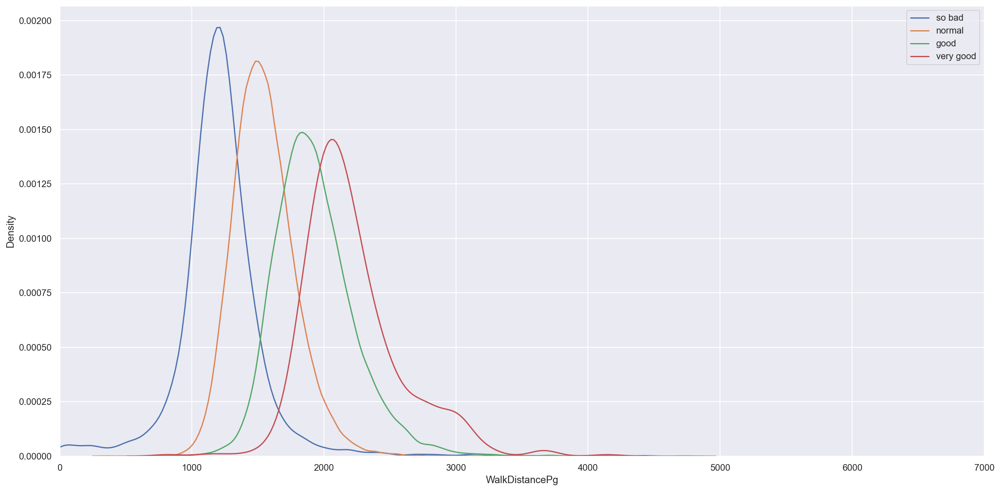

In [38]:
# top10확률 별 걸어서 이동한거리 비교
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['WalkDistancePg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,7000)
    print(f'squad 승률 {gb}% 평균 :',df['WalkDistancePg'].mean())
    
plt.show()

drop_col(total_ratio,"Top10Ratio")

* 승률이 높은 그룹일 수록 걸어서 이동하는 거리가 많다.

#### 가설7 결론
* 걷는거리가 많을수록 top10확률 높아진다.
* top10확률 75~100%대로 높이고 싶다면, 걸어서 이동하는 거리를 약 2000m정도 높이는 것이 좋다.

## 세부가설 8: 차를 타고 이동한 거리가 증가할수록 Top10에 들어갈 확률이 증가할 것이다.

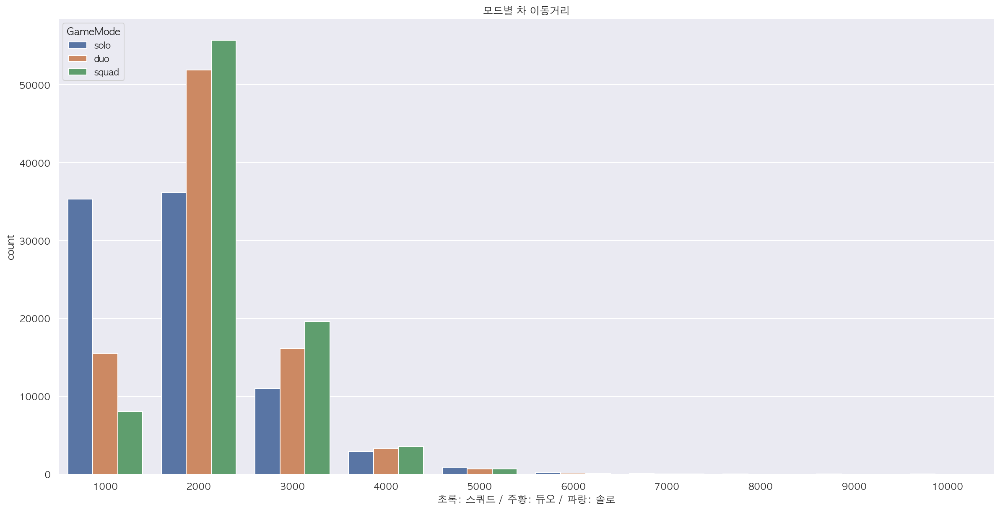

In [39]:
# 모드별 차 이동거리 CountPlot
plt.rcParams['font.family'] = 'AppleGothic'
create_range_data(total_ratio,"RideDistancePg",0,10000,1000)
plt.figure(figsize=(20,10))
sns.countplot('RideDistancePg_range',data=total_ratio,hue='GameMode')
plt.title("모드별 차 이동거리")
plt.xlabel("초록: 스쿼드 / 주황: 듀오 / 파랑: 솔로")
plt.grid
plt.show()
drop_col(total_ratio,'RideDistancePg')

* 팀원이 많은 모드일수록 차를 타고 이동하는 거리가 많다. 스쿼드에서 차를 가장 많이 이용한다.

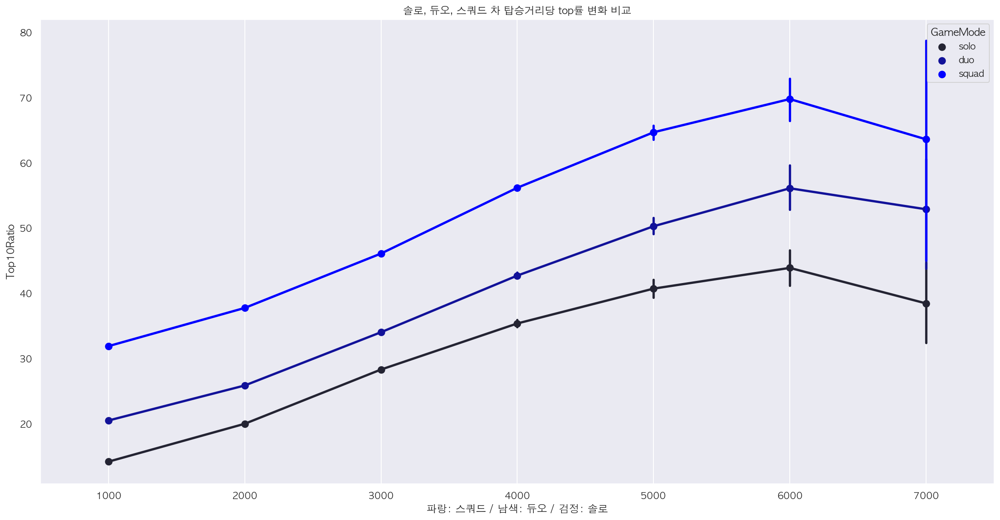

In [40]:
create_range_data(total_ratio,"RideDistancePg",0,7000,1000)


plt.figure(figsize=(20,10))
sns.pointplot(x='RideDistancePg_range',y='Top10Ratio',hue='GameMode', data=total_ratio,color='blue')
plt.title("솔로, 듀오, 스쿼드 차 탑승거리당 top률 변화 비교")
plt.xlabel("파랑: 스쿼드 / 남색: 듀오 / 검정: 솔로")
plt.grid()
plt.show()
drop_col(total_ratio,'RideDistancePg')

* 차를 타고 이동한 거리가 증가할수록 top10확률이 상승한다. 

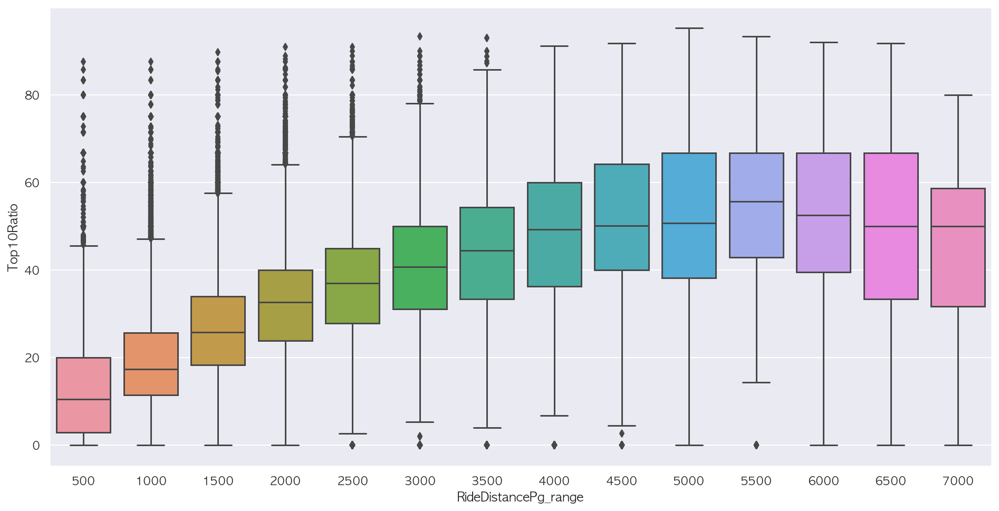

In [50]:
create_range_data(total_ratio,"RideDistancePg",0,7000,500)

plt.figure(figsize=(16,8))
sns.boxplot(x='RideDistancePg_range',y='Top10Ratio', data=total_ratio)
plt.show()
drop_col(total_ratio, 'RideDistancePg')

squad 승률 25% 평균 : 1101.7426514809827
squad 승률 50% 평균 : 1639.2033707524774
squad 승률 75% 평균 : 2430.827737897093
squad 승률 100% 평균 : 3647.8130697569145


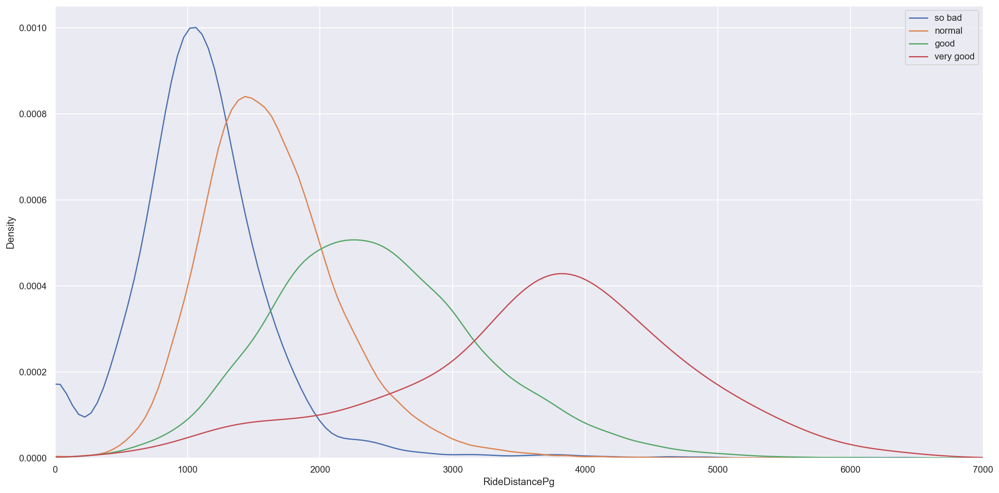

In [42]:
# 승률에 따라 차타고 이동한 거리를 비교해보자.
create_range_data(total_ratio,'Top10Ratio',0,100,25)

plt.figure(figsize=(20,10))
for gb in total_ratio['Top10Ratio_range'].unique():
    df = total_ratio[(total_ratio['Top10Ratio_range']==gb)&(total_ratio['GameMode']=='squad')]
    sns.distplot(df['RideDistancePg'], bins=10, hist=False,kde=True)
    plt.legend(['so bad','normal','good','very good'])
    plt.xlim(0,7000)
    print(f'squad 승률 {gb}% 평균 :',df['RideDistancePg'].mean())
    
plt.show()

drop_col(total_ratio,"Top10Ratio")

* top10확률이 매우 높은 플레이어 그룹은 게임당 약 3500m를 차를타고 이동 
* 확실히 승률이 높은 그룹이 차를 적극적으로 이용함을 알 수 있다.

#### 가설8 결론
* 차를 통해 이동하는 거리가 많을 수록 top10에 들 확률이 높아진다.
* 차를 적극적으로 이용해야 top10에 들 확률을 높일 수 있다. 3000m이상 차를 이용하여 이동하는 것이 좋다.

### etc) K/D가 낮다면 탈것을 적극적으로 이용하자.

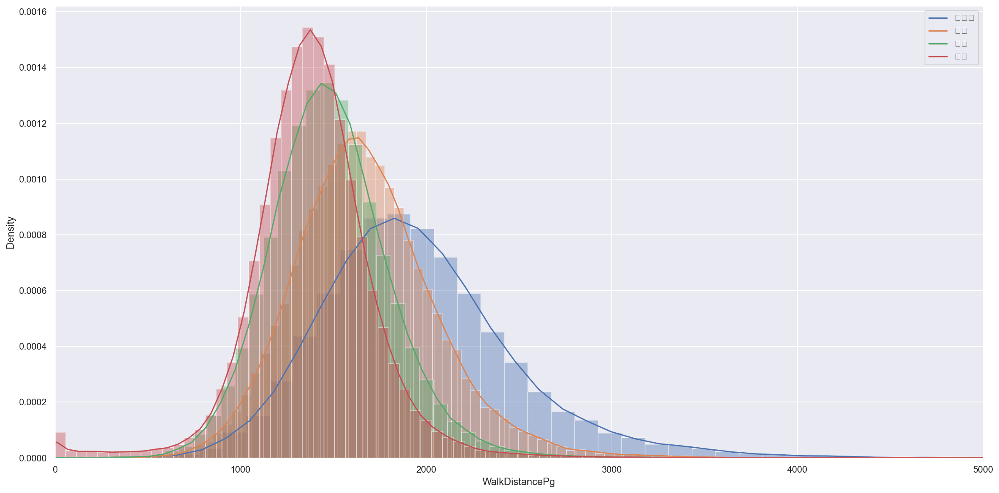

In [43]:
# k/d 그룹별 걸어서 이동한 거리 비교
plt.figure(figsize=(20,10))
for gb in total_ratio['K/D_category'].unique():
    sns.distplot(total_ratio[total_ratio['K/D_category']==gb]['WalkDistancePg'],bins=200, kde=True)
    plt.legend(['초고수','고수','보통','초보'])
plt.xlim(0,5000)
plt.show()

* k/d가 높으면 걸어서 이동한 거리도 증가하는 모습을 보인다.
* 걸어서 이동할 경우, 교전상황이 많이 발생하고, 당연히 k/d가 높은 플레이어가 생존확률이 높기때문에, 일반적으로 걸어서 이동하는 거리가 더 많다.

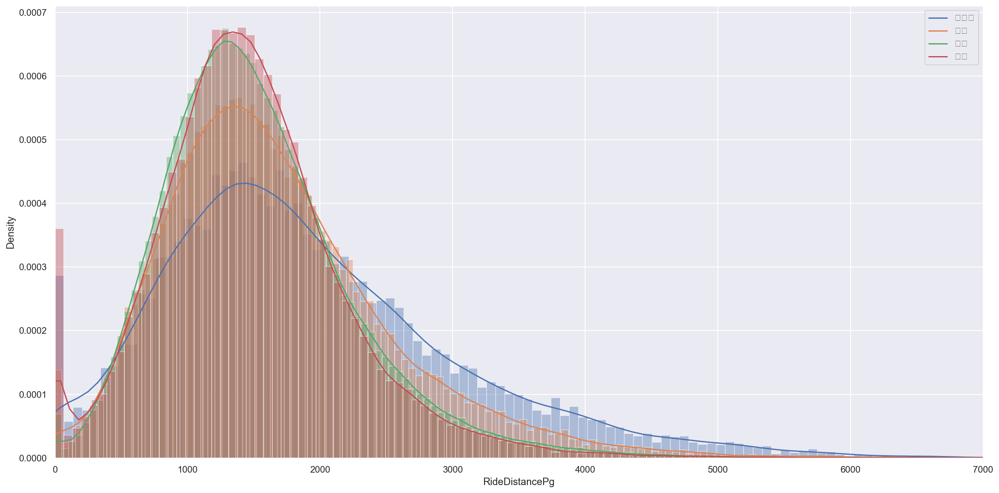

In [44]:
# 차타고 이동한 거리 비교
plt.figure(figsize=(20,10))
for gb in total_ratio['K/D_category'].unique():
    sns.distplot(total_ratio[total_ratio['K/D_category']==gb]['RideDistancePg'],bins=200, kde=True)
    plt.legend(['초고수','고수','보통','초보'])
plt.xlim(0,7000)
plt.show()

* 걸어서 이동한 거리보다 차를 타고 이동한 거리는 k/d별로 차이가 상대적으로 미미하다.

* top10확률 따라서 RideDistance가 확연한 차이를 보이는 것을 감안하면, 탈것을 적극적으로 이용하는 것이 부족한 k/d를 매우고 top10에 들어갈 좋은 전략이 될 것.


---

### 종합 결론 

#### Top10에 들 확률을 높이기 위해서는.. (스쿼드 기준)

- Kill/Death : 약 2.0 이상
- 게임당 Damage : 231 (한명을 죽이기 위해 필요한 데미지: 100)
- 회복아이템 : 약 3개 이상 (2.8)
- 부스트아이템 : 약 2개 이상 (2.3)
- 부활 : 게임당 0.3회 (3게임당 1회)
- 이동거리 : 많으면 많을수록 좋다. 약 5000M이상
- (걸어서 이동: 약 2000m 이상, 차타고 이동: 약 3000m 이상)

